In [16]:
train_path=r"data/augmented_data/plant/train"
valid_path=r"data/augmented_data/plant/valid"

In [18]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

transform = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.ToTensor(),
])

train_dataset = datasets.ImageFolder(train_path, transform=transform)
valid_dataset = datasets.ImageFolder(valid_path, transform=transform)

valid_size = len(valid_dataset)
test_size = int(0.10 * valid_size)
valid_size_new = valid_size - test_size
test_dataset, new_valid_dataset = random_split(valid_dataset, [test_size, valid_size_new])

batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(new_valid_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

In [19]:
len(train_dataset)

70299

In [22]:
len(valid_dataset)

17572

In [24]:
len(test_dataset)

1757

In [26]:
len(new_valid_dataset)

15815

In [28]:
import collections

# Get class names from the dataset
class_names = train_dataset.classes

# Count the number of images per class using the targets attribute
class_counts = collections.Counter(train_dataset.targets)

# Create a DataFrame from the counts
df_counts = pd.DataFrame(list(class_counts.items()), columns=['ClassIndex', 'Count'])
df_counts['ClassName'] = df_counts['ClassIndex'].apply(lambda idx: class_names[idx])
df_counts = df_counts[['ClassName', 'Count']]
df_counts
# Export DataFrame as Excel file
df_counts.to_excel("class_counts.xlsx", index=False)


NameError: name 'pd' is not defined

In [67]:
import collections

# Get class names from the dataset
class_names = train_dataset.classes

# Count the number of images per class using the targets attribute
class_counts = collections.Counter(valid_dataset.targets)

# Create a DataFrame from the counts
df_counts = pd.DataFrame(list(class_counts.items()), columns=['ClassIndex', 'Count'])
df_counts['ClassName'] = df_counts['ClassIndex'].apply(lambda idx: class_names[idx])
df_counts = df_counts[['ClassName', 'Count']]
df_counts
# Export DataFrame as Excel file
df_counts.to_excel("class_counts.xlsx", index=False)


In [77]:
import collections

# Get class names from the dataset
class_names = test_dataset.classes

# Count the number of images per class using the targets attribute
class_counts = collections.Counter(valid_dataset.targets)

# Create a DataFrame from the counts
df_counts = pd.DataFrame(list(class_counts.items()), columns=['ClassIndex', 'Count'])
df_counts['ClassName'] = df_counts['ClassIndex'].apply(lambda idx: class_names[idx])
df_counts = df_counts[['ClassName', 'Count']]
df_counts
# Export DataFrame as Excel file
df_counts.to_excel("class_counts.xlsx", index=False)


AttributeError: 'Subset' object has no attribute 'classes'

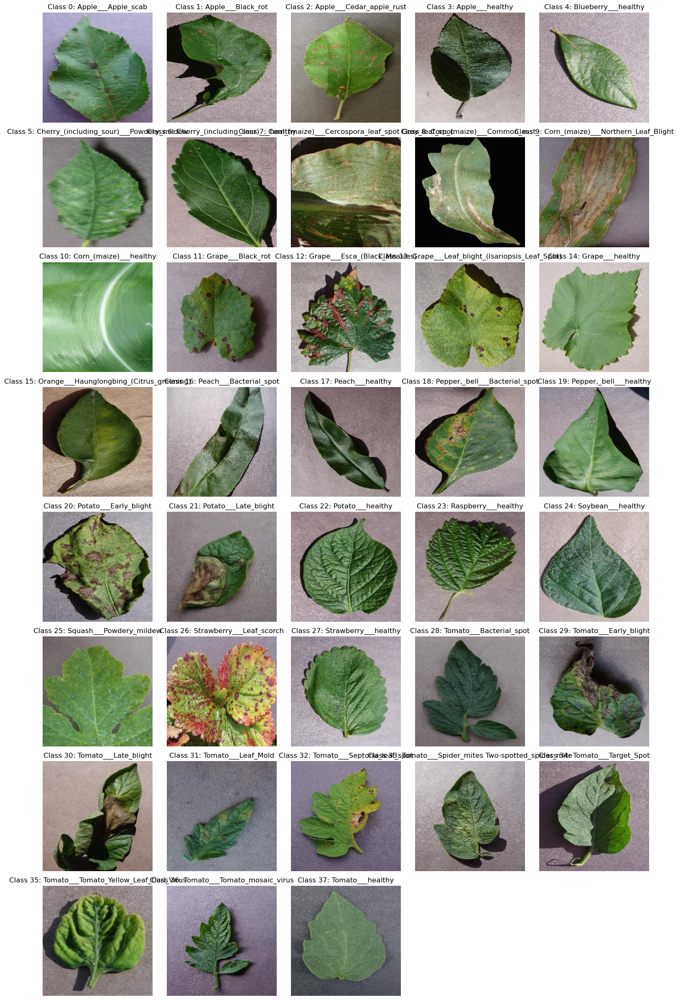

In [30]:
import math
import matplotlib.pyplot as plt

# Create a dictionary to hold one image per class
class_images = {}

# Iterate over the dataset to collect one image for each class
for image, label in train_dataset:
    if label not in class_images:
        class_images[label] = image
    # Stop once we have one image for every class
    if len(class_images) == len(train_dataset.classes):
        break

# Calculate number of classes and grid dimensions
num_classes = len(train_dataset.classes)
num_cols = 5
num_rows = math.ceil(num_classes / num_cols)

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3))

# Flatten axs for easy iteration (in case of multiple rows)
axs = axs.flatten()

# Plot one image per class
for idx, (label, img_tensor) in enumerate(sorted(class_images.items())):
    # Convert tensor image (C, H, W) to numpy array (H, W, C) for plotting
    img = img_tensor.permute(1, 2, 0).numpy()
    axs[idx].imshow(img)
    axs[idx].set_title(f"Class {label}: {train_dataset.classes[label]}")
    axs[idx].axis('off')

# Hide any remaining subplots if num_classes isn't a multiple of num_cols
for ax in axs[num_classes:]:
    ax.axis('off')

plt.tight_layout()
plt.show()


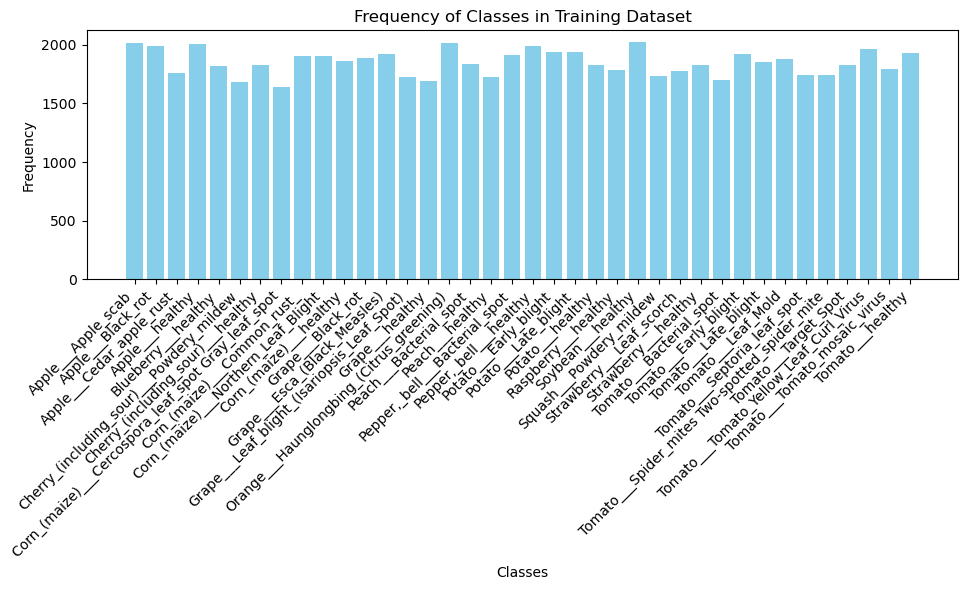

In [4]:
import matplotlib.pyplot as plt
from collections import Counter

# If your dataset has the 'targets' attribute, use that; otherwise use the second element of each sample from 'imgs'
if hasattr(train_dataset, 'targets'):
    labels = train_dataset.targets
else:
    labels = [label for _, label in train_dataset.imgs]

# Count the frequency of each label
label_counts = Counter(labels)

# Get the class names from the dataset
classes = train_dataset.classes

# Create a list of frequencies in order of the class indices
frequencies = [label_counts[i] for i in range(len(classes))]

# Plotting the bar chart of class frequencies
plt.figure(figsize=(10, 6))
plt.bar(classes, frequencies, color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Frequency')
plt.title('Frequency of Classes in Training Dataset')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [31]:
import torch.nn as nn

class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()

        # Conv1
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(2, 2)

        # SepConv2
        self.sep_conv2_depth = nn.Conv2d(16, 16, kernel_size=3, padding=1, groups=16)
        self.sep_conv2_point = nn.Conv2d(16, 32, kernel_size=1)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(2, 2)

        # SepConv3
        self.sep_conv3_depth = nn.Conv2d(32, 32, kernel_size=3, padding=1, groups=32)
        self.sep_conv3_point = nn.Conv2d(32, 64, kernel_size=1)
        self.relu3 = nn.ReLU()
        self.bn1 = nn.BatchNorm2d(64)
        self.pool3 = nn.MaxPool2d(2, 2)

        # SepConv4
        self.sep_conv4_depth = nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64)
        self.sep_conv4_point = nn.Conv2d(64, 128, kernel_size=1)
        self.relu4 = nn.ReLU()
        self.pool4 = nn.MaxPool2d(2, 2)

        # SepConv5
        self.sep_conv5_depth = nn.Conv2d(128, 128, kernel_size=3, padding=1, groups=128)
        self.sep_conv5_point = nn.Conv2d(128, 256, kernel_size=1)
        self.relu5 = nn.ReLU()
        self.bn2 = nn.BatchNorm2d(256)
        self.pool5 = nn.MaxPool2d(2, 2)
        self.dropout1 = nn.Dropout(0.3)

        # SepConv6
        self.sep_conv6_depth = nn.Conv2d(256, 256, kernel_size=3, padding=1, groups=256)
        self.sep_conv6_point = nn.Conv2d(256, 512, kernel_size=1)
        self.relu6 = nn.ReLU()
        self.bn3 = nn.BatchNorm2d(512)
        self.pool6 = nn.MaxPool2d(2, 2)
        self.dropout2 = nn.Dropout(0.4)

        # Global Avg Pool
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)

        # Dense layers
        self.fc1 = nn.Linear(512, 512)
        self.bn4 = nn.BatchNorm1d(512)
        self.relu7 = nn.ReLU()
        self.dropout3 = nn.Dropout(0.5)

        self.fc2 = nn.Linear(512, 256)
        self.bn5 = nn.BatchNorm1d(256)
        self.relu8 = nn.ReLU()
        self.dropout4 = nn.Dropout(0.5)

        self.fc3 = nn.Linear(256, 128)
        self.bn6 = nn.BatchNorm1d(128)
        self.relu9 = nn.ReLU()
        self.dropout5 = nn.Dropout(0.6)

        self.fc4 = nn.Linear(128, 38)

    def forward(self, x):
        x = self.pool1(self.relu1(self.conv1(x)))
        x = self.pool2(self.relu2(self.sep_conv2_point(self.sep_conv2_depth(x))))
        x = self.pool3(self.bn1(self.relu3(self.sep_conv3_point(self.sep_conv3_depth(x)))))
        x = self.pool4(self.relu4(self.sep_conv4_point(self.sep_conv4_depth(x))))
        x = self.dropout1(self.pool5(self.bn2(self.relu5(self.sep_conv5_point(self.sep_conv5_depth(x))))))
        x = self.dropout2(self.pool6(self.bn3(self.relu6(self.sep_conv6_point(self.sep_conv6_depth(x))))))
        x = self.global_avg_pool(x)
        x = x.view(x.size(0), -1)  # Flatten
        x = self.dropout3(self.relu7(self.bn4(self.fc1(x))))
        x = self.dropout4(self.relu8(self.bn5(self.fc2(x))))
        x = self.dropout5(self.relu9(self.bn6(self.fc3(x))))
        x = self.fc4(x)
        return x

In [32]:
import torch
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNNModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, min_lr=1e-7)

In [65]:
print(model)
total_params = sum(p.numel() for p in model.parameters())
print(f"Number of parameters: {total_params}")

CNNModel(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1): ReLU()
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (sep_conv2_depth): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16)
  (sep_conv2_point): Conv2d(16, 32, kernel_size=(1, 1), stride=(1, 1))
  (relu2): ReLU()
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (sep_conv3_depth): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32)
  (sep_conv3_point): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1))
  (relu3): ReLU()
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (sep_conv4_depth): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64)
  (sep_conv4_point): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1))
  (re

In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.model_selection import KFold
from torch.utils.data import DataLoader, ConcatDataset

# Parameters
num_epochs = 100
batch_size = 128
patience = 10
k_folds = 5

# Combine train and validation datasets
combined_dataset = ConcatDataset([train_dataset, new_valid_dataset])

# Initialize K-Fold cross-validation
kfold = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Store results
fold_results = {}
fold_history = {}

# Start K-Fold Cross Validation
for fold, (train_idx, _) in enumerate(kfold.split(combined_dataset)):
    print(f"\n----- Fold {fold + 1}/{k_folds} -----")
    
    # Create subset datasets using indices
    train_subset = torch.utils.data.Subset(combined_dataset, train_idx)

    # DataLoaders for current fold
    train_loader_fold = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
    valid_loader_fold = test_loader

    # Initialize model, optimizer, loss function, and scheduler
    model = CNNModel().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.0001)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, min_lr=1e-8)

    best_val_loss = float('inf')
    trigger_times = 0

    train_losses, val_losses = [], []
    train_accs, val_accs = [], []

    # Training Loop
    for epoch in range(num_epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        
        for images, labels in train_loader_fold:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_acc = correct / total
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        # Validation Loop
        model.eval()
        val_loss, correct, total = 0.0, 0, 0
        with torch.no_grad():
            for images, labels in valid_loader_fold:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        val_loss /= len(valid_loader_fold)
        val_acc = correct / total
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        print(f"Fold {fold+1}, Epoch [{epoch+1}/{num_epochs}] -> Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")
        
        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), f'fold_{fold+1}_best_model.pth')
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= patience:
                print(f"Early stopping triggered at epoch {epoch+1} for Fold {fold+1}")
                break

    fold_results[fold+1] = best_val_loss
    fold_history[fold+1] = {
        'train_losses': train_losses,
        'train_accuracies': train_accs,
        'val_losses': val_losses,
        'val_accuracies': val_accs
    }

print("\nK-Fold Cross Validation Results")
for fold, loss in fold_results.items():
    print(f"Fold {fold}: Best Validation Loss = {loss:.4f}")


----- Fold 1/5 -----
Fold 1, Epoch [1/100] -> Train Loss: 3.3830, Val Loss: 2.9354, Train Acc: 0.1035, Val Acc: 0.2419
Fold 1, Epoch [2/100] -> Train Loss: 2.7206, Val Loss: 2.3700, Train Acc: 0.2591, Val Acc: 0.3654
Fold 1, Epoch [3/100] -> Train Loss: 2.1971, Val Loss: 2.2507, Train Acc: 0.3900, Val Acc: 0.3512
Fold 1, Epoch [4/100] -> Train Loss: 1.8236, Val Loss: 1.8301, Train Acc: 0.4922, Val Acc: 0.4963
Fold 1, Epoch [5/100] -> Train Loss: 1.5431, Val Loss: 1.5906, Train Acc: 0.5687, Val Acc: 0.5526
Fold 1, Epoch [6/100] -> Train Loss: 1.3379, Val Loss: 1.2620, Train Acc: 0.6215, Val Acc: 0.6443
Fold 1, Epoch [7/100] -> Train Loss: 1.1806, Val Loss: 1.0638, Train Acc: 0.6679, Val Acc: 0.6779
Fold 1, Epoch [8/100] -> Train Loss: 1.0457, Val Loss: 0.7846, Train Acc: 0.7026, Val Acc: 0.7786
Fold 1, Epoch [9/100] -> Train Loss: 0.9423, Val Loss: 0.8954, Train Acc: 0.7312, Val Acc: 0.7308
Fold 1, Epoch [10/100] -> Train Loss: 0.8485, Val Loss: 0.7026, Train Acc: 0.7566, Val Acc: 0.78

In [33]:
import torch
from sklearn.metrics import classification_report, confusion_matrix

# Load the best saved model weights
model.load_state_dict(torch.load('fold_3_best_model.pth', weights_only=True))
model.eval()

test_loss = 0.0
correct = 0
total = 0
all_labels = []
all_preds = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        test_loss += loss.item()
        
        # Get the predictions
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        # Collect predictions and true labels for reports
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())

# Average the loss over the test set
test_loss /= len(test_loader)
test_accuracy = correct / total

print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Generate and print the classification report and confusion matrix
print("Classification Report:")
print(classification_report(all_labels, all_preds))

print("Confusion Matrix:")
print(confusion_matrix(all_labels, all_preds))


Test Loss: 0.0362, Test Accuracy: 0.9903
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        51
           1       1.00      1.00      1.00        44
           2       1.00      1.00      1.00        56
           3       1.00      1.00      1.00        38
           4       1.00      1.00      1.00        42
           5       1.00      1.00      1.00        41
           6       0.97      1.00      0.99        38
           7       0.98      0.93      0.95        44
           8       1.00      0.98      0.99        56
           9       0.91      0.97      0.94        30
          10       1.00      1.00      1.00        42
          11       0.98      1.00      0.99        43
          12       1.00      0.98      0.99        56
          13       1.00      1.00      1.00        39
          14       1.00      1.00      1.00        36
          15       1.00      0.98      0.99        52
          16     

In [28]:
import pandas as pd
df=pd.DataFrame(fold_history)

In [32]:
df.iloc[:,2]

train_losses        [3.363887695301884, 2.65549247428526, 2.114025...
train_accuracies    [0.10831603547633217, 0.2845945043619631, 0.42...
val_losses          [2.832742827279227, 2.2188884701047624, 1.8621...
val_accuracies      [0.26294820717131473, 0.40239043824701193, 0.5...
Name: 3, dtype: object

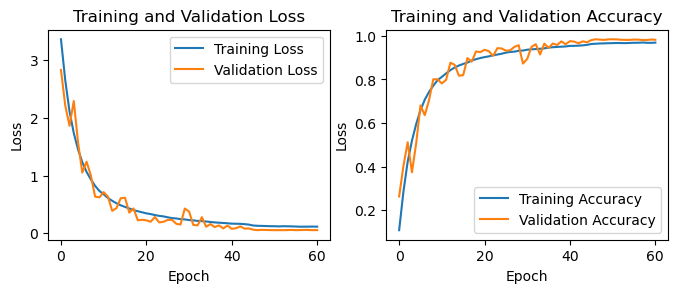

In [36]:
import matplotlib.pyplot as plt
# Plot the training and validation loss curves
plt.figure(figsize=(8, 6))
plt.subplot(2,2,1)
plt.plot(df.iloc[:,2]['train_losses'], label='Training Loss')
plt.plot(df.iloc[:,2]['val_losses'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.subplot(2,2,2)
plt.plot(df.iloc[:,2]['train_accuracies'], label='Training Accuracy')
plt.plot(df.iloc[:,2]['val_accuracies'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

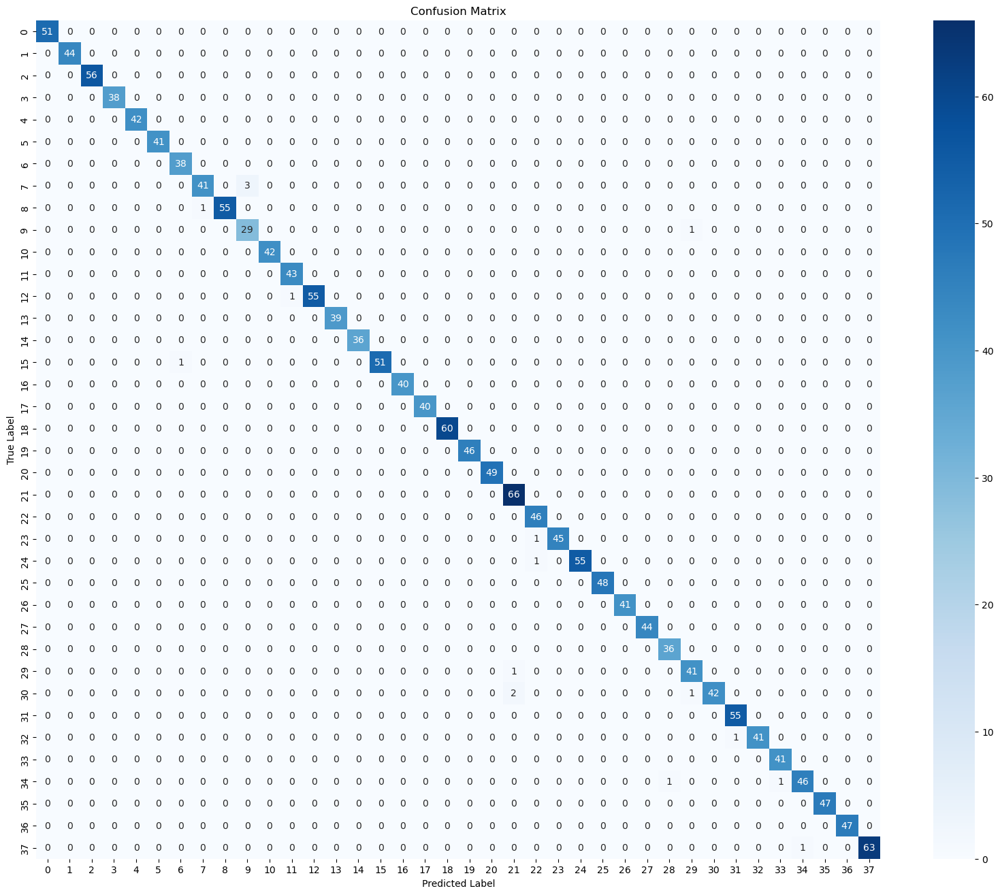

In [38]:
# Compute and plot the confusion matrix
import seaborn as sns
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(20, 16))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [69]:
import torch
import torch.nn as nn

# Dictionary to store activations
activations = {}

# Hook function to capture output
def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

# Register hooks on all Conv2d layers in your model
for name, module in model.named_modules():
    if isinstance(module, nn.Conv2d):
        module.register_forward_hook(get_activation(name))


In [77]:
from torchvision import transforms
from PIL import Image

# Define your image transformations
preprocess = transforms.Compose([
    transforms.Resize((128,128)),  # set target height and width
    transforms.ToTensor(),
    # Normalize if needed, e.g., transforms.Normalize(mean, std)
])

# Load and preprocess the image
img = Image.open(r'data/augmented_data/plant/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG').convert('RGB')
img_tensor = preprocess(img)
img_tensor = img_tensor.unsqueeze(0)  # add batch dimension


In [81]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)         # move model to the device
img_tensor = img_tensor.to(device)  # move input tensor to the device

model.eval()
with torch.no_grad():
    output = model(img_tensor)


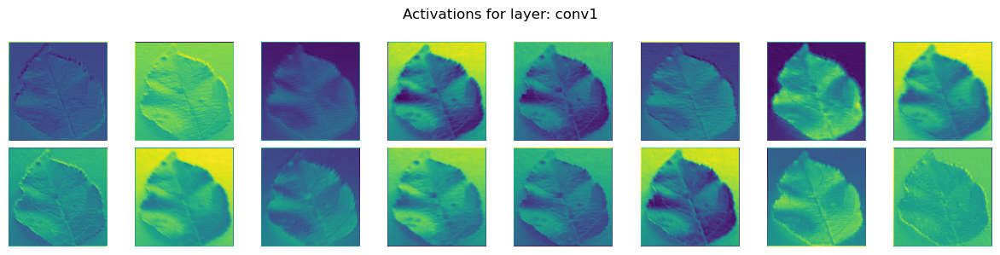

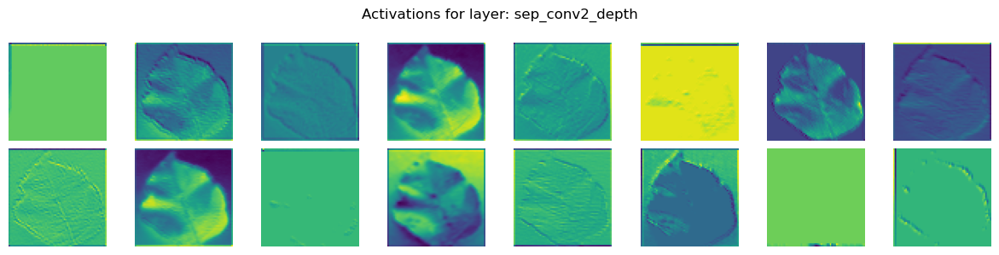

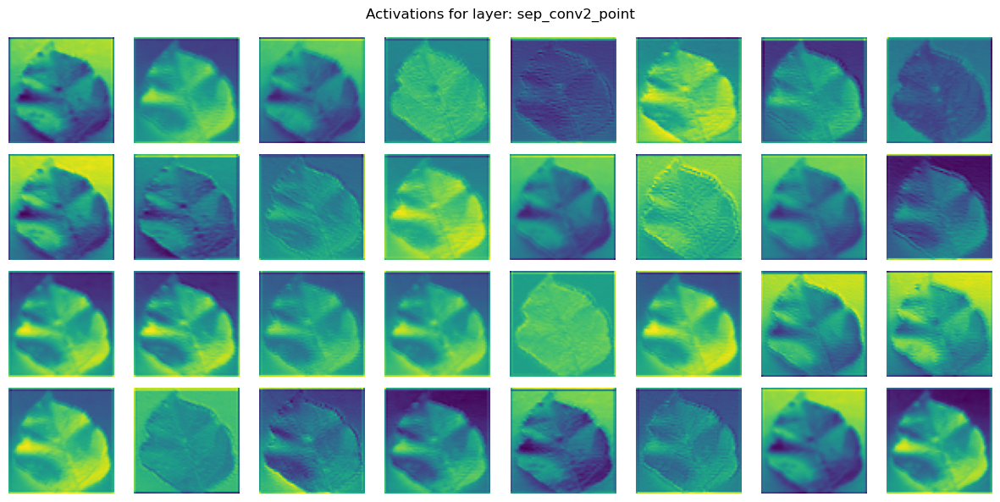

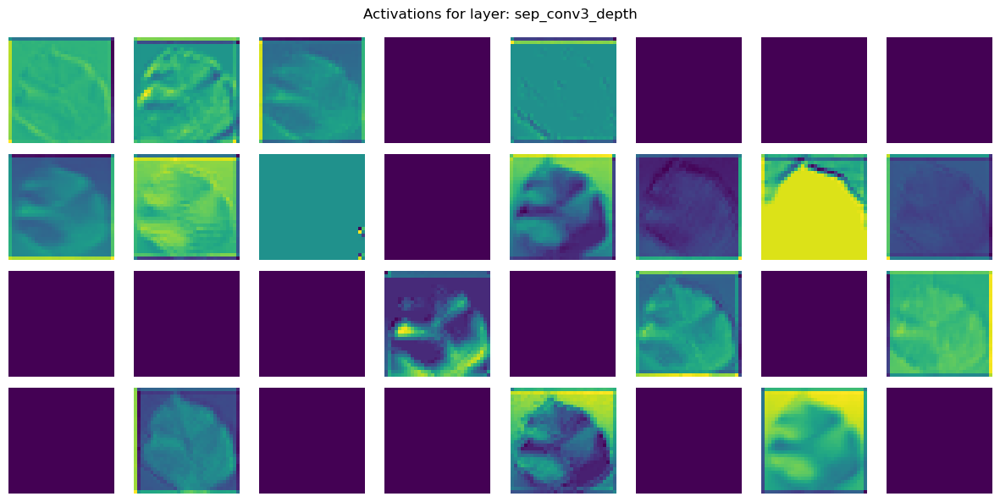

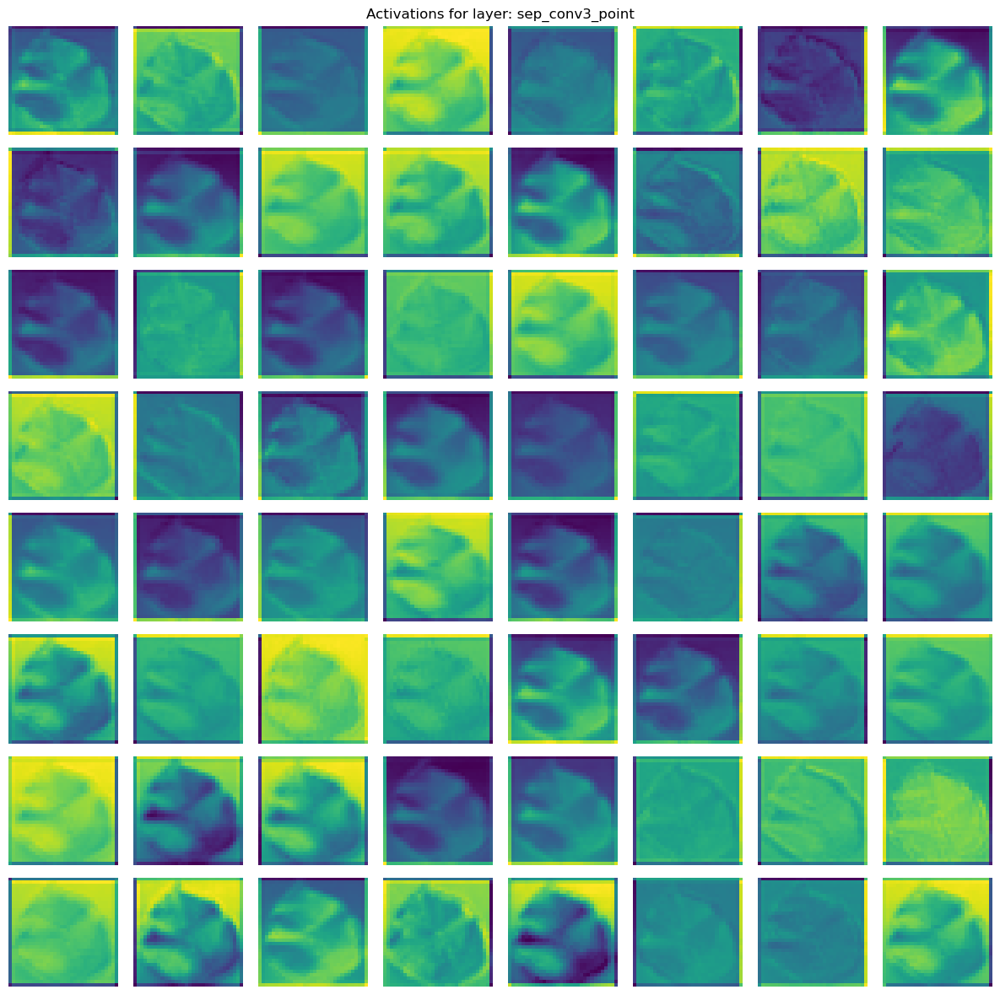

...

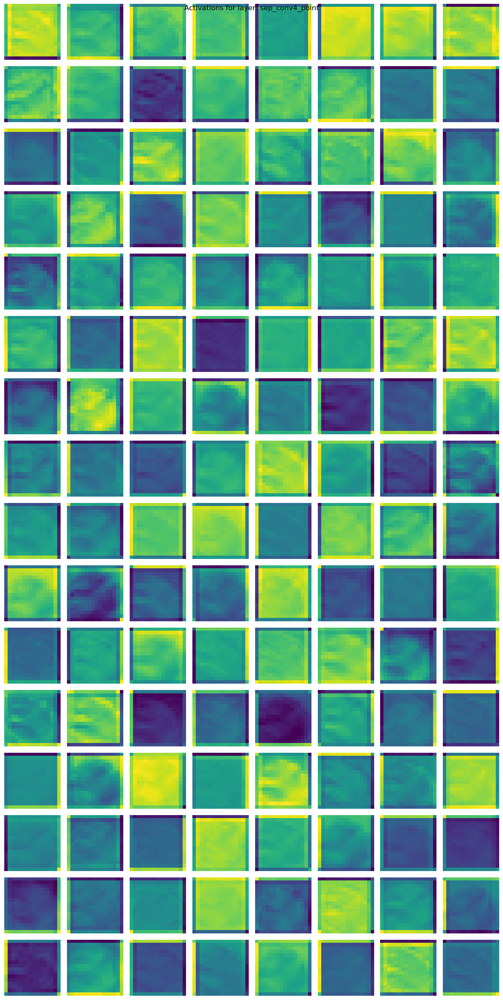

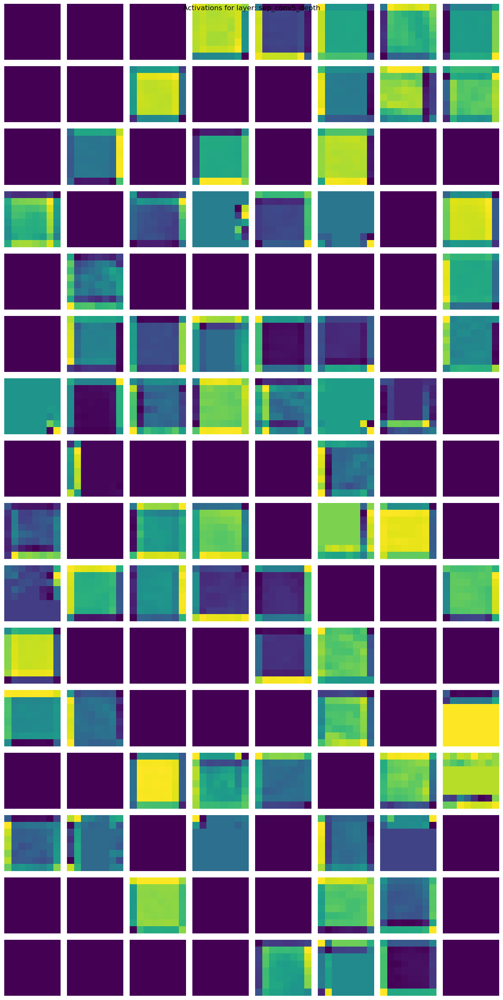

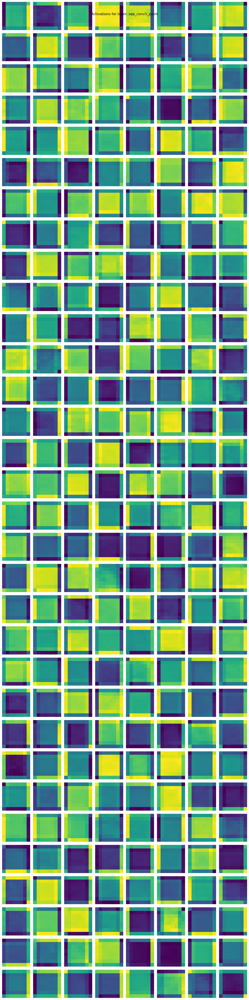

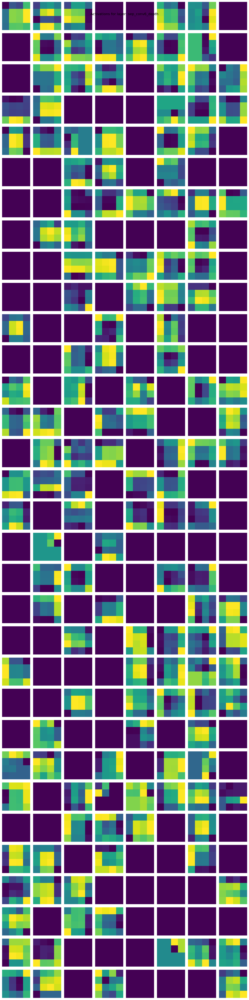

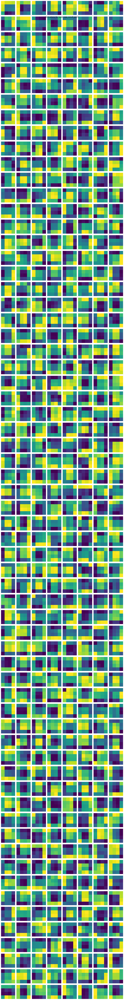

In [83]:
import matplotlib.pyplot as plt

# Iterate through each conv layer's activations
for layer_name, act in activations.items():
    # act shape: [batch_size, num_channels, height, width]
    act = act[0]  # select the first image in the batch
    num_channels = act.shape[0]
    
    # Define grid parameters: adjust n_cols as needed
    n_cols = 8
    n_rows = (num_channels // n_cols) + (1 if num_channels % n_cols else 0)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.5, n_rows * 1.5))
    fig.suptitle(f"Activations for layer: {layer_name}")

    for idx in range(num_channels):
        row = idx // n_cols
        col = idx % n_cols
        
        # Get the activation for channel idx
        channel_act = act[idx].cpu().numpy()
        
        # Plot the channel activation map
        axes[row, col].imshow(channel_act, cmap='viridis')
        axes[row, col].axis('off')
    
    # Turn off any unused subplots
    for idx in range(num_channels, n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()


In [42]:
import pandas as pd

# Data dictionary with 10 papers and their details
data = {
    "Study": [
        "Ferentinos (2018)[1]",
        "Too et al. (2019)[2]",
        "Fuentes et al. (2017)[3]",
        "Brahimi et al. (2017)[4]",
        "Picon et al. (2019)[5]",
        "Johannes et al. (2017)[6]",
        "DeepCrop (2023)[7]",
        "Deep Learning for Plant Disease Detection (2023)[8]",
        "Ramesh et al. (2018)[10]",
        "Proposed Model (LightNet)"
    ],
    "Model": [
        "VGG16",
        "DenseNet169",
        "ResNet50",
        "GoogleNet",
        "Pruned CNN",
        "MobileNet",
        "ResNet50 Transfer Learning",
        "Custom CNN",
        "Hybrid (HOG + SVM)",
        "LightNet"
    ],
    "Parameters (Millions)": [
        138,
        14,
        25,
        6.8,
        1,
        3.5,
        25,
        10,
        "N/A",
        0.6162
    ],
    "Dataset Used": [
        "PlantVillage",
        "PlantVillage",
        "Field images",
        "Tomato dataset",
        "Wheat images",
        "Cassava images",
        "PlantVillage (Kaggle)",
        "Mixed dataset",
        "MVJ College of Engineering",
         "PlantVillage (Kaggle)"
    ],
    "Accuracy (%)": [
        99.53,
        99.75,
        83,
        97.3,
        87,
        80,
        98.98,
        97.00,
        92.00,
        99.03
    ]
}

# Create DataFrame
df = pd.DataFrame(data)
df
df.to_excel("report.xlsx", index=True)
df.index = range(1, len(df) + 1)
df

,Study,Model,Parameters (Millions),Dataset Used,Accuracy (%)
1,Ferentinos (2018)[1],VGG16,138,PlantVillage,99.53
2,Too et al. (2019)[2],DenseNet169,14,PlantVillage,99.75
3,Fuentes et al. (2017)[3],ResNet50,25,Field images,83.00
4,Brahimi et al. (2017)[4],GoogleNet,6.8,Tomato dataset,97.30
5,Picon et al. (2019)[5],Pruned CNN,1,Wheat images,87.00
6,Johannes et al. (2017)[6],MobileNet,3.5,Cassava images,80.00
7,DeepCrop (2023)[7],ResNet50 Transfer Learning,25,PlantVillage (Kaggle),98.98
8,Deep Learning for Plant Disease Detection (202...,Custom CNN,10,Mixed dataset,97.00
9,Ramesh et al. (2018)[10],Hybrid (HOG + SVM),N/A,MVJ College of Engineering,92.00
10,Proposed Model (LightNet),LightNet,0.6162,PlantVillage (Kaggle),99.03


In [44]:
def highlight_row(row):
    # If this is the row we want to bold, return a list with 'font-weight: bold' for all cells
    if row.name == 10:  # row index 6
        return ['font-weight: bold'] * len(row)
    else:
        return [''] * len(row)

# Apply the styling to the DataFrame
styled_df = df.style.apply(highlight_row, axis=1)

# To display the styled DataFrame in a Jupyter Notebook, simply call:
styled_df

,Study,Model,Parameters (Millions),Dataset Used,Accuracy (%)
1,Ferentinos (2018)[1],VGG16,138,PlantVillage,99.530000
2,Too et al. (2019)[2],DenseNet169,14,PlantVillage,99.750000
3,Fuentes et al. (2017)[3],ResNet50,25,Field images,83.000000
4,Brahimi et al. (2017)[4],GoogleNet,6.800000,Tomato dataset,97.300000
5,Picon et al. (2019)[5],Pruned CNN,1,Wheat images,87.000000
6,Johannes et al. (2017)[6],MobileNet,3.500000,Cassava images,80.000000
7,DeepCrop (2023)[7],ResNet50 Transfer Learning,25,PlantVillage (Kaggle),98.980000
8,Deep Learning for Plant Disease Detection (2023)[8],Custom CNN,10,Mixed dataset,97.000000
9,Ramesh et al. (2018)[10],Hybrid (HOG + SVM),N/A,MVJ College of Engineering,92.000000
10,Proposed Model (LightNet),LightNet,0.616200,PlantVillage (Kaggle),99.030000


In [5]:
# Given the number as a string with commas
number_str = "6,16,230"

# Remove commas to convert it into an integer
number_int = int(number_str.replace(",", ""))

# Convert to millions by dividing by 1,000,000
million_value = number_int / 1_000_000

print(f"{number_str} as a number is {number_int} and in millions it is approximately {million_value:.5f} million.")


6,16,230 as a number is 616230 and in millions it is approximately 0.61623 million.


In [6]:
from torchvision import datasets

# Assuming you have an ImageFolder dataset already loaded:
dataset = datasets.ImageFolder("data/augmented_data/plant/train")

# Print indices and corresponding class names
for idx, class_name in enumerate(dataset.classes):
    print(f"Index: {idx}, Class Name: {class_name}")


Index: 0, Class Name: Apple___Apple_scab
Index: 1, Class Name: Apple___Black_rot
Index: 2, Class Name: Apple___Cedar_apple_rust
Index: 3, Class Name: Apple___healthy
Index: 4, Class Name: Blueberry___healthy
Index: 5, Class Name: Cherry_(including_sour)___Powdery_mildew
Index: 6, Class Name: Cherry_(including_sour)___healthy
Index: 7, Class Name: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Index: 8, Class Name: Corn_(maize)___Common_rust_
Index: 9, Class Name: Corn_(maize)___Northern_Leaf_Blight
Index: 10, Class Name: Corn_(maize)___healthy
Index: 11, Class Name: Grape___Black_rot
Index: 12, Class Name: Grape___Esca_(Black_Measles)
Index: 13, Class Name: Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Index: 14, Class Name: Grape___healthy
Index: 15, Class Name: Orange___Haunglongbing_(Citrus_greening)
Index: 16, Class Name: Peach___Bacterial_spot
Index: 17, Class Name: Peach___healthy
Index: 18, Class Name: Pepper,_bell___Bacterial_spot
Index: 19, Class Name: Pepper,_bell___healthy


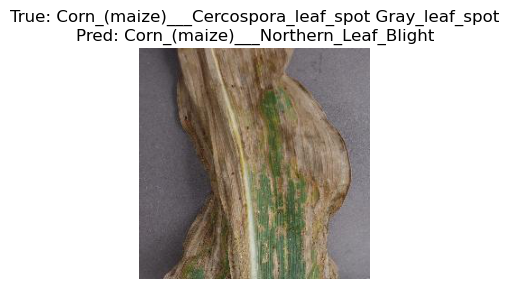

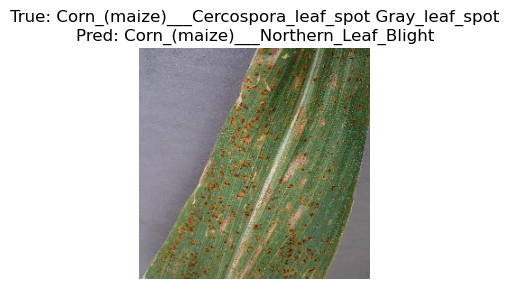

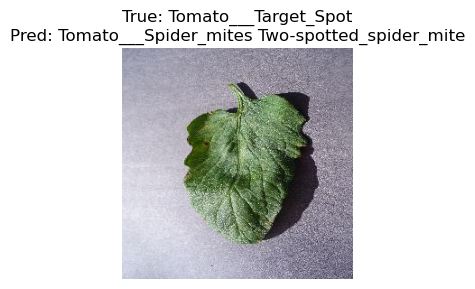

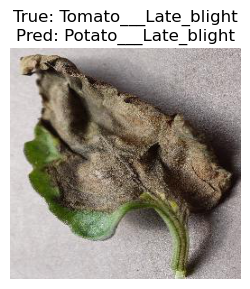

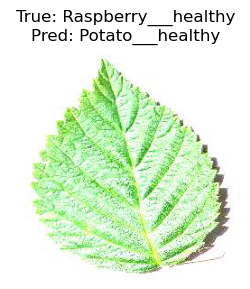

...

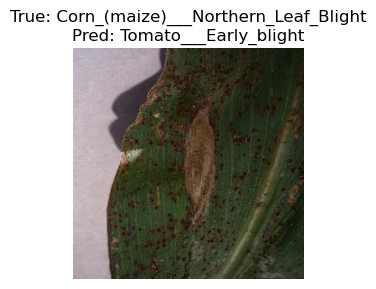

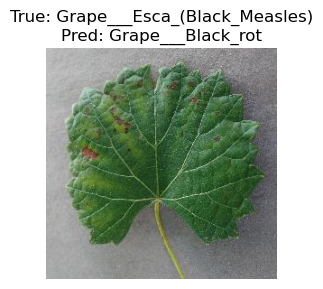

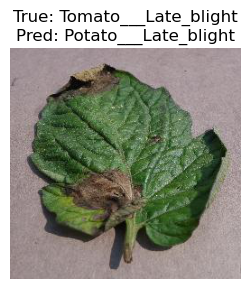

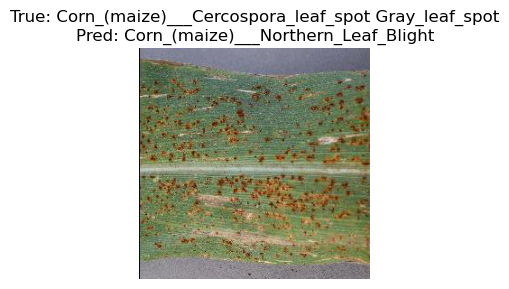

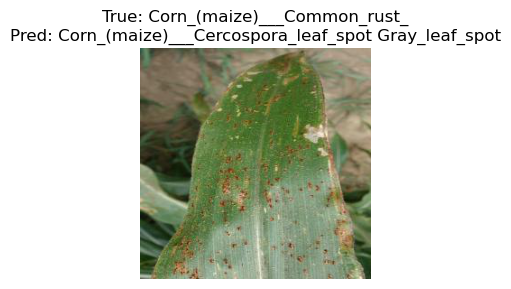

In [40]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Set the model to evaluation mode
model.eval()

misclassified_images = []
true_labels_list = []
predicted_labels_list = []

# Iterate over the test DataLoader (or validation loader)
with torch.no_grad():
    for images, labels in test_loader:  # assuming test_loader is defined
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        
        # Loop over each image in the batch
        for img, true_label, pred_label in zip(images, labels, preds):
            if true_label != pred_label:
                misclassified_images.append(img.cpu())
                true_labels_list.append(true_label.cpu().item())
                predicted_labels_list.append(pred_label.cpu().item())

# Plot the misclassified images
# Optionally, set up the number of images per row in your grid
num_images = len(misclassified_images)
images_per_row = 5

for idx, (img, true_label, pred_label) in enumerate(zip(misclassified_images, true_labels_list, predicted_labels_list)):
    # Convert tensor image to numpy array (assuming images are in [C, H, W] format)
    npimg = img.numpy().transpose((1, 2, 0))
    plt.figure(figsize=(3,3))
    plt.imshow(npimg)
    plt.title(f"True: {dataset.classes[true_label]}\nPred: {dataset.classes[pred_label]}")
    plt.axis('off')
    plt.show()


In [46]:
from collections import Counter

# Assuming test_loader is your DataLoader for the test dataset
label_counter = Counter()

# Loop through the test loader batches
for images, labels in test_loader:
    label_counter.update(labels.tolist())

# Print out the class names and counts
for class_idx, count in label_counter.items():
    print(f"Class: {test_dataset.dataset.classes[class_idx]}, Count: {count}")


Class: Soybean___healthy, Count: 56
Class: Apple___Cedar_apple_rust, Count: 56
Class: Orange___Haunglongbing_(Citrus_greening), Count: 52
Class: Apple___healthy, Count: 38
Class: Potato___Early_blight, Count: 49
Class: Blueberry___healthy, Count: 42
Class: Strawberry___Leaf_scorch, Count: 41
Class: Pepper,_bell___healthy, Count: 46
Class: Apple___Apple_scab, Count: 51
Class: Grape___Leaf_blight_(Isariopsis_Leaf_Spot), Count: 39
Class: Corn_(maize)___Common_rust_, Count: 56
Class: Peach___healthy, Count: 40
Class: Corn_(maize)___healthy, Count: 42
Class: Grape___Esca_(Black_Measles), Count: 56
Class: Raspberry___healthy, Count: 46
Class: Pepper,_bell___Bacterial_spot, Count: 60
Class: Strawberry___healthy, Count: 44
Class: Potato___Late_blight, Count: 66
Class: Cherry_(including_sour)___healthy, Count: 38
Class: Tomato___Target_Spot, Count: 48
Class: Tomato___healthy, Count: 64
Class: Peach___Bacterial_spot, Count: 40
Class: Potato___healthy, Count: 46
Class: Tomato___Late_blight, Count